In [61]:
import trimesh
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch

PROJECT_PATH = '../'
input_img = PROJECT_PATH + 'data/front3d/0a9c667d-033d-448c-b17c-dc55e6d3c386/rgb_0019.png'

# Load Instance Mesh 

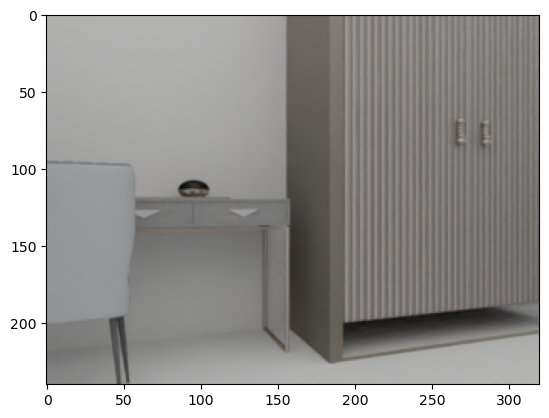

In [62]:
input_img = input_img
img = Image.open(input_img).convert('RGB')
plt.imshow(img)

In [63]:
mesh_path=PROJECT_PATH + 'outputs/front3d_samples/mesh_instances.ply'
mesh = trimesh.load(mesh_path)
mesh.apply_transform([  
                        [ 1.0000,  0.0000,  0.0000, 0.0000],
                        [ 0.0000,  -1.0000,  0.0000, 0.0000],
                        [ 0.0000,  0.0000,  -1.0000, 0.0000],
                        [ 0.0000,  0.0000,  0.0000, 1.0000]
                    ])
mesh.show()

In [64]:
colors = []

for face_color in mesh.visual.face_colors:
    color = tuple(face_color.tolist())
    if color not in colors:
        colors.append(color)
    
    

# https://github.com/mikedh/trimesh/issues/668
face_mask = (mesh.visual.face_colors == list(colors[3])).all(axis=1)
color_mesh = mesh.copy()
color_mesh.update_faces(face_mask)
color_mesh.show()

In [65]:
box = color_mesh.bounding_box_oriented.bounds

diff = box[1] - box[0]
diff = np.max(diff)

#center of mesh bounding box
center = (box[1] + box[0])/2
print('Center: ', center)

Center:  [ 0.40266947  0.20470355 -2.14404065]


# Compute SDF from Mesh

In [66]:
from pysdf import SDF
#Compute sdf from mesh
f = SDF(color_mesh.vertices, color_mesh.faces); # (num_vertices, 3) and (num_faces, 3)

# Compute some SDF values (negative outside);
# takes a (num_points, 3) array, converts automatically
origin_sdf = f([0, 0, 0])
print(origin_sdf)

[-1.8446743e+19]


In [67]:
#Generate Coordinate Volume with given coordinate ranges
def generate_volume(x_range, y_range, z_range):
    # Generate 1D arrays for x, y, and z coordinates
    x_coords = np.linspace(x_range[0], x_range[1], 256)
    y_coords = np.linspace(y_range[0], y_range[1], 256)
    z_coords = np.linspace(z_range[0], z_range[1], 256)

    # Create a 3D grid of coordinates using NumPy's meshgrid
    x, y, z = np.meshgrid(x_coords, y_coords, z_coords, indexing='ij')

    # Combine the coordinates into a 3D volume
    volume = np.stack((x, y, z), axis=-1)

    return volume

In [68]:
x_range = (center[0]-diff/2, center[0]+diff/2)
y_range = (center[1]-diff/2, center[1]+diff/2)
z_range = (center[2]-diff/2, center[2]+diff/2)
print(x_range, y_range, z_range)

#Generate Coordinate Volume around mesh center
resulting_volume = generate_volume(x_range, y_range, z_range)

(-1.2724738103913227, 2.077812754989342) (-1.4704397277129202, 1.8798468376677444) (-3.8191839317221685, -0.4688973663415039)


In [74]:
#Sample Coordinates from SDF to get (64, 64, 64) SDF-Volume
sampled = f(resulting_volume.reshape(-1,3))
sdf_sampled = sampled.reshape(256,256,256)
print(sdf_sampled)

[[[-1.8446743e+19 -1.8446743e+19 -1.8446743e+19 ... -1.8446743e+19
   -1.8446743e+19 -1.8446743e+19]
  [-1.8446743e+19 -1.8446743e+19 -1.8446743e+19 ... -1.8446743e+19
   -1.8446743e+19 -1.8446743e+19]
  [-1.8446743e+19 -1.8446743e+19 -1.8446743e+19 ... -1.8446743e+19
   -1.8446743e+19 -1.8446743e+19]
  ...
  [-1.8446743e+19 -1.8446743e+19 -1.8446743e+19 ... -1.8446743e+19
   -1.8446743e+19 -1.8446743e+19]
  [-1.8446743e+19 -1.8446743e+19 -1.8446743e+19 ... -1.8446743e+19
   -1.8446743e+19 -1.8446743e+19]
  [-1.8446743e+19 -1.8446743e+19 -1.8446743e+19 ... -1.8446743e+19
   -1.8446743e+19 -1.8446743e+19]]

 [[-1.8446743e+19 -1.8446743e+19 -1.8446743e+19 ... -1.8446743e+19
   -1.8446743e+19 -1.8446743e+19]
  [-1.8446743e+19 -1.8446743e+19 -1.8446743e+19 ... -1.8446743e+19
   -1.8446743e+19 -1.8446743e+19]
  [-1.8446743e+19 -1.8446743e+19 -1.8446743e+19 ... -1.8446743e+19
   -1.8446743e+19 -1.8446743e+19]
  ...
  [-1.8446743e+19 -1.8446743e+19 -1.8446743e+19 ... -1.8446743e+19
   -1.8446

In [70]:
from skimage import measure
vertices, faces, _, _ = measure.marching_cubes(sdf_sampled, level=0)

mesh = trimesh.Trimesh(vertices,faces)
mesh.show()

# Initialize Deep SDF

In [71]:
# first set up which gpu to use
import os
gpu_ids = 0
os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_ids}"

In [73]:
# import libraries
import numpy as np
from IPython.display import Image as ipy_image
from IPython.display import display
from termcolor import colored, cprint


import torch
import torch.backends.cudnn as cudnn
cudnn.benchmark = True
import torchvision.utils as vutils

from models.base_model import create_model
from utils.util_3d import read_sdf, render_sdf, render_mesh, sdf_to_mesh, save_mesh_as_gif

%load_ext autoreload
%autoreload 2

ModuleNotFoundError: No module named 'SDFusion'

In [ ]:
# options for the model. please check `utils/demo_util.py` for more details
from utils.demo_util import SDFusionMM2ShapeOpt

seed = 2023
opt = SDFusionMM2ShapeOpt(gpu_ids=gpu_ids, seed=seed)
device = opt.device

[*] SDFusionMM2ShapeOption initialized.


In [ ]:
# initialize SDFusion model
ckpt_path = 'saved_ckpt/sdfusion-mm2shape.pth'
opt.init_model_args(ckpt_path=ckpt_path)

SDFusion = create_model(opt)
cprint(f'[*] "{SDFusion.name()}" loaded.', 'cyan')

Working with z of shape (1, 3, 16, 16, 16) = 12288 dimensions.
[*] VQVAE: weight successfully load from: saved_ckpt/vqvae-snet-all.pth
[*] loading state_dict with strict=False!
[*] resnet18 successfully loaded from https://download.pytorch.org/models/resnet18-f37072fd.pth.
[*] weight successfully load from: saved_ckpt/sdfusion-mm2shape.pth
[*] setting ddim_steps=100
[*] Model has been created: SDFusion-Multi-Modal-Conditional-Shape-Generation-Model
[*] "SDFusion-Multi-Modal-Conditional-Shape-Generation-Model" loaded.


(240, 320, 3)
(240, 320)


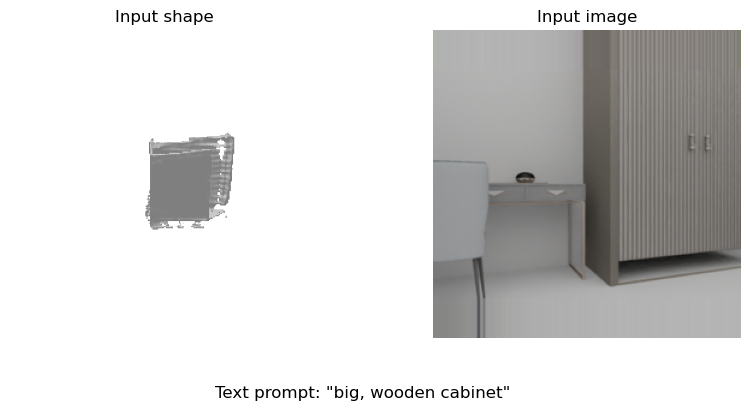

In [ ]:
from utils.demo_util import preprocess_image, get_shape_mask, tensor_to_pil
import torchvision.transforms as transforms

# mm2shape
out_dir = 'demo_results'
if not os.path.exists(out_dir): os.makedirs(out_dir)

sdf =torch.Tensor(sdf_sampled)[None, None, ...] # TODO: does SDFusion need negative inside or outside?

# get text
input_txt = "big, wooden cabinet"
#input_img = PROJECT_PATH + "data/front3d-sample/rgb_0007_couch.png"

# get image TODO: Get actual Image of bed with semantic mask
img_np = np.array(Image.open(input_img).convert('RGB'))
print(img_np.shape)
input_mask = np.ones((img_np.shape[0], img_np.shape[1]))#"demo_data/revolving-chair-mask.png"
print(input_mask.shape)

img_for_vis, img_clean = preprocess_image(input_img, input_mask)
mean, std = [0.5, 0.5, 0.5], [0.5, 0.5, 0.5]
transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
    transforms.Resize((256, 256)),
])
img_clean = transforms(img_clean).unsqueeze(0)

# pack into a dict
test_data = {
    'sdf': sdf,
    'img': img_clean,
    'text': [input_txt],
}

rend_sdf = render_sdf(SDFusion.renderer, (sdf).to(device))

# visualize input
# for d in [ tensor_to_pil(rend_sdf), img_for_vis ]:
#     display(d)
# print("text prompt: ", input_txt)

# visualize input
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].axis('off')
ax[0].imshow(tensor_to_pil(rend_sdf))
ax[0].title.set_text('Input shape')
ax[1].axis('off')
ax[1].imshow(img_for_vis)
ax[1].title.set_text('Input image')

fig.suptitle(f'Text prompt: "{input_txt}"', y=-0.01)
plt.show()

In [ ]:

# ddim_steps = 100
ddim_steps = 50
ddim_eta = 0.1
uc_scale = 5.

# demo: run four sets of scales
meshes = []
txt_img_scales = [(0., 0.), (1., 0.), (0., 1.), (1., 1.)]
for txt_scale, img_scale in txt_img_scales:
    SDFusion.inference(test_data, ddim_steps=ddim_steps, ddim_eta=ddim_eta, uc_scale=uc_scale)
    # save the generation results
    sdf_gen = SDFusion.gen_df
    mesh_gen = sdf_to_mesh(sdf_gen)
    mesh_trim = trimesh.Trimesh(mesh_gen.verts_list()[0].detach().cpu().numpy(),mesh_gen.faces_list()[0].detach().cpu().numpy())
    meshes.append(mesh_trim)
    gen_name = f'{out_dir}/mm2shape-gen_shape-txt_{txt_scale}-img_{img_scale}.gif'
    save_mesh_as_gif(SDFusion.renderer, mesh_gen, nrow=3, out_name=gen_name)

# save input partial shape as well
#sdf_part = SDFusion.x_part
#mesh_part = sdf_to_mesh(sdf_part)

Data shape for DDIM sampling is (1, 3, 16, 16, 16), eta 0.1
Running DDIM Sampling with 50 timesteps


DDIM Sampler: 100%|██████████| 50/50 [00:05<00:00,  8.93it/s]


Data shape for DDIM sampling is (1, 3, 16, 16, 16), eta 0.1
Running DDIM Sampling with 50 timesteps


DDIM Sampler: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s]


Data shape for DDIM sampling is (1, 3, 16, 16, 16), eta 0.1
Running DDIM Sampling with 50 timesteps


DDIM Sampler: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s]


Data shape for DDIM sampling is (1, 3, 16, 16, 16), eta 0.1
Running DDIM Sampling with 50 timesteps


DDIM Sampler: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s]


In [ ]:
meshes[0].show() #When it doesnt use txt or img input - Looks like a table?

In [ ]:
meshes[1].show() # Only uses txt - lots of holes!

In [ ]:
meshes[2].show() # Only uses image as info 

In [ ]:
meshes[3].show() # Uses both txt and image